## Import Libraries

In [1]:
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns
%matplotlib inline
import swifter
#sns.set(style="darkgrid", font_scale=1)
import matplotlib.cm as cm
from matplotlib.colors import Normalize
#from descartes import PolygonPatch


import numpy as np
import warnings
warnings.filterwarnings("ignore")
%config InlineBackend.figure_format ='retina'
import datetime as dt


import geopandas as gpd
import descartes
from shapely.geometry import Point, Polygon

import pickle
import gc
import scipy

import itertools
from itertools import groupby
import re
import string

import nltk
from wordcloud import WordCloud

import cartopy.crs as crs
import cartopy.feature as cfeature


#from sklearn.metrics import confusion_matrix


In [2]:
# So that we can look at full data, its better to set the viewing options.
pd.set_option("display.max_columns", 50)
pd.set_option("display.max_rows", 500)
pd.set_option("display.max_colwidth", -1)

## Read in the Data

In [3]:
df_chunk = pd.read_csv('gun-violence-data_01-2013_03-2018.csv', chunksize=100000)
chunk_list = []  # append each chunk df here 

# Each chunk is in df format
for chunk in df_chunk:  
    # perform data filtering 
    #chunk_filter = chunk_preprocessing(chunk)
    
    # Once the data filtering is done, append the chunk to list
    chunk_list.append(chunk)
    
# concat the list into dataframe 
violence_data = pd.concat(chunk_list)

In [4]:
violence_data.dtypes

incident_id                    int64  
date                           object 
state                          object 
city_or_county                 object 
address                        object 
n_killed                       int64  
n_injured                      int64  
incident_url                   object 
source_url                     object 
incident_url_fields_missing    bool   
congressional_district         float64
gun_stolen                     object 
gun_type                       object 
incident_characteristics       object 
latitude                       float64
location_description           object 
longitude                      float64
n_guns_involved                float64
notes                          object 
participant_age                object 
participant_age_group          object 
participant_gender             object 
participant_name               object 
participant_relationship       object 
participant_status             object 
participant_type         

### Change Data Types to Save Memory Usage
We'll convert few columns data types so as to save space. For example, int64 and float 64 can be converted to int32 as well as float 32.

In [5]:
import time
start_time = time.time()
violence_data[['incident_id','n_killed','n_injured']] = violence_data[['incident_id','n_killed','n_injured']].apply(np.int8)
time.time() - start_time

0.13014507293701172

In [6]:
violence_data[['latitude','longitude']] = violence_data[['latitude','longitude']].apply(np.float32)
violence_data[['n_guns_involved','state_house_district','state_senate_district']] = violence_data[['n_guns_involved','state_house_district','state_senate_district']].apply(np.int8)


In [7]:
# Similarly we'll check for columns with missing values

missing_cols_list=violence_data.columns[violence_data.isnull().any()]
len(missing_cols_list)

18

In [8]:
violence_data.info(memory_usage='deep')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 239677 entries, 0 to 239676
Data columns (total 29 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   incident_id                  239677 non-null  int8   
 1   date                         239677 non-null  object 
 2   state                        239677 non-null  object 
 3   city_or_county               239677 non-null  object 
 4   address                      223180 non-null  object 
 5   n_killed                     239677 non-null  int8   
 6   n_injured                    239677 non-null  int8   
 7   incident_url                 239677 non-null  object 
 8   source_url                   239209 non-null  object 
 9   incident_url_fields_missing  239677 non-null  bool   
 10  congressional_district       227733 non-null  float64
 11  gun_stolen                   140179 non-null  object 
 12  gun_type                     140226 non-null  object 
 13 

In [9]:
violence_data.apply(pd.Series.nunique)

incident_id                    256   
date                           1725  
state                          51    
city_or_county                 12898 
address                        198037
n_killed                       16    
n_injured                      23    
incident_url                   239677
source_url                     213989
incident_url_fields_missing    1     
congressional_district         54    
gun_stolen                     349   
gun_type                       2502  
incident_characteristics       18126 
latitude                       101240
location_description           27595 
longitude                      112347
n_guns_involved                100   
notes                          136652
participant_age                18951 
participant_age_group          898   
participant_gender             873   
participant_name               113488
participant_relationship       284   
participant_status             2150  
participant_type               259   
sources     

The columns `state`,`state_house_district`,`state_senate_district` are highly repetitive, hence can be transformed into categorical types so as to save space. 

In [10]:
start_time = time.time()
violence_data[['state','state_house_district','state_senate_district']] = violence_data[['state','state_house_district','state_senate_district']].astype('category')
time.time()-start_time

0.08899879455566406

Earlier, we saw that around 18 columns have missing data. Do some columns have significantly high percentage of missing values?

<AxesSubplot:>

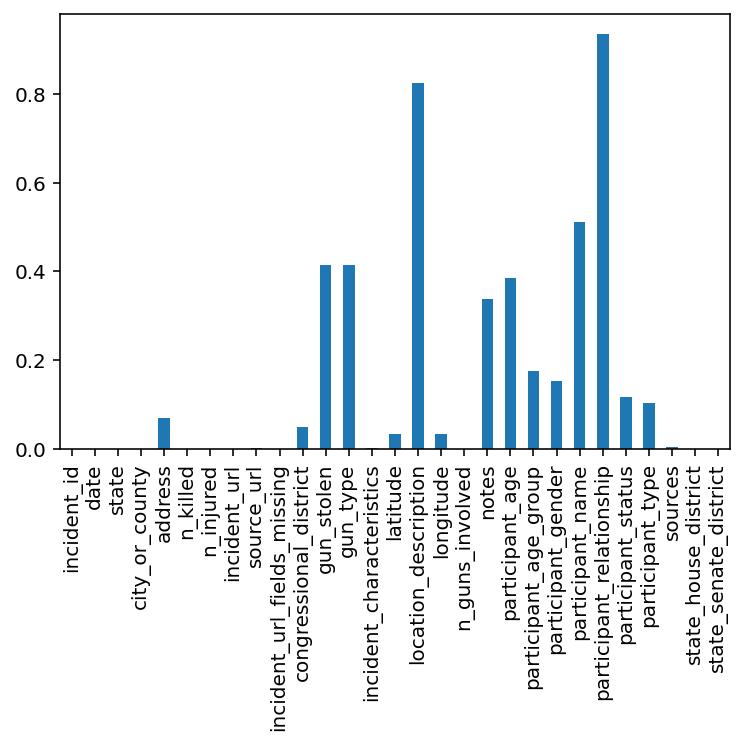

In [11]:
missing_rows_df = violence_data.isnull().sum() / violence_data.shape[0]
#print(missing_rows_df)
missing_rows_df.plot(kind = 'bar')

Above barplot shows that columns `location_description`, and `participant_relationship` have significantly high percentage of missing values, hence can be dropped from the dataframe.

In [12]:
gun_violence = violence_data.drop(['location_description','participant_relationship'],axis=1)

In [13]:
participant_notnull = pd.notnull(gun_violence['participant_name'])
gun_violence[participant_notnull].head(4);

## Data Preprocessing
Some columns like `participant_gender`, `participant_age_group` etc. have strange structire with pipes and colons. In the later sections, we'll extract relevant information from those columns. Before that, we'll extract date and time information from the `date_time` column.

In [14]:
# extract date, month, and year as well as weekday
gun_violence['date_time'] = pd.to_datetime(gun_violence['date'])
gun_violence['month'] = gun_violence['date_time'].dt.month
gun_violence['year'] = gun_violence['date_time'].dt.year
gun_violence['day'] = gun_violence['date_time'].dt.day
gun_violence['weekday'] = gun_violence['date_time'].dt.weekday




Function to convert numbers to weekdays

In [15]:
gun_violence['day_name']=gun_violence['weekday'].\
map(lambda x: 'Monday' if x==0 else ('Tuesday' if x==1 else('Wednesday' if x==2 \
else('Thursday' if x==3 else('Friday' if x==4 
                                                                                                                                         else('Saturday' if x==5 else 'Sunday'))))))

In [ ]:
gun_violence.to_pickle('gun_violence.pickle')

In [ ]:
gun_violence = pd.read_pickle('gun_violence.pickle')

### Define New Columns for Different Gun types
Different incidents involve guns procured differently. Sometimes, stolen guns are used, at other times, licensed guns were used, whereas for some guns we don't know how they were procured. This information is stored in the column `gun_stolen`. To make it more useful, we'll extract this information and define new columns which'll contain count of stolen guns, non-stolen guns, as well as unknown guns in this corresponding incident. We rename those columns as `stolen_cnt`,`Unknown`, and `Not-stolen`.

In [16]:

#split the strings in order to retrive the count of guns for respective types; unknown, stolen, not-stolen

from collections import defaultdict
def get_user_mapping(txt):
    if txt == "NA":
        return {}
    mapping = defaultdict(list)
    if '||' in txt:
        for d in txt.split("||"):
            val = d.split("::")[0]
            key = d.split("::")[1]
            mapping[key].append(val)
            
    elif '|' in txt:
        for d in txt.split('|'):
            val = d.split(":")[0]
            key = d.split(":")[1]
            mapping[key].append(val)
            
            
    else:
        if '::' in txt:
            val = txt.split("::")[0]
            key = txt.split("::")[1]
            mapping[key].append(val)
        else:
            val = txt.split(":")[0]
            key = txt.split(":")[1]
            mapping[key].append(val)
            

            
    return mapping

In [17]:
gun_violence['gun_stolen'] = gun_violence['gun_stolen'].fillna("NA")
gun_violence['gun_stolen_map'] = gun_violence['gun_stolen'].swifter.progress_bar(False). \
                               apply(get_user_mapping, axis=0)

In [18]:
def gun_type_count(dict_new):
    mapping_new=defaultdict(int)
    if dict_new=={}:
        return {}
    for k in ['Unknown','Stolen','Not-stolen']:
        mapping_new[k]=len(dict_new[k])
    return mapping_new
        

In [19]:
gun_violence['gun_stolen_cnt'] = gun_violence['gun_stolen_map'].swifter.progress_bar(False).apply(gun_type_count, axis=0)

In [20]:
def gun_types_stolen(dict2):
    if dict2=={}:
        return 0
    return dict2['Stolen']
        
gun_violence['stolen_cnt'] = gun_violence['gun_stolen_cnt'].swifter.progress_bar(False).apply(gun_types_stolen, axis=0)    

In [21]:
def gun_types_unknown(dict2):
    if dict2=={}:
        return 0
    return dict2['Unknown']
        
gun_violence['Unknown'] = gun_violence['gun_stolen_cnt'].swifter.progress_bar(False).apply(gun_types_unknown, axis=0) 

In [22]:
def gun_types_not_stolen(dict2):
    if dict2=={}:
        return 0
    return dict2['Not-stolen']
        
gun_violence['Not-stolen'] = gun_violence['gun_stolen_cnt'].swifter.progress_bar(False).apply(gun_types_not_stolen, axis=0) 

In [23]:
gun_violence['total_gun_cnt'] = gun_violence['Not-stolen']+gun_violence['Unknown']+gun_violence['stolen_cnt']
gun_violence.index[gun_violence['total_gun_cnt']!=gun_violence['n_guns_involved']]

Int64Index([  9454,  15153,  31416,  42862,  44876,  51155,  62683,  69524,
             69527,  69739,  76585,  76975,  76976,  85777,  85795,  86192,
             86768,  91849,  94543,  95847,  98804,  99968, 101763, 102885,
            103796, 104383, 119424, 120025, 124253, 125514, 125526, 125527,
            127651, 129989, 134714, 134715, 134718, 139493, 152141, 153678,
            158058, 161366, 170174, 171754, 194140, 196630, 198193, 199081,
            201715, 203092, 210601, 211605, 212149, 212410, 213070, 214380,
            215747, 216337, 217114, 226559, 226788, 228780, 229933, 230060,
            233948, 234023, 234065, 234244, 234306, 234318, 234354, 234564,
            236679, 237467, 238021, 238043, 238089],
           dtype='int64')

In [24]:
mismatch_gun_cnt= gun_violence.iloc[selection,:]
positive_mismatch = mismatch_gun_cnt[mismatch_gun_cnt['n_guns_involved']>0]
positive_mismatch[['gun_stolen','gun_type','n_guns_involved','Unknown','stolen_cnt','Not-stolen']].head(10);

NameError: name 'selection' is not defined

Earlier we saw that there are close to 77 rows where total guns involved calculated using new columns does not match the column `n_guns_involved`. On closer investigation, we see that for few rows the column `n_guns_involved` has negative values, though the column `gun_stolen` has several values for the type of gun stolen. Since there are only 77 rows, we should be okay and can ignore this small discrepancy.

### Define Columns for Age Information

Similar to above calculation, we'll also extract the age information regarding suspects as well as victims using the `participant_age`, as well as `participant_age_group` columns. It will help us to observe the distribution of ages of victims as well as suspects.

In addition we should also look at average count of teenager suspects involved in an incident.

In [25]:
# Convert string into dictionary
def StringToDic(S1):
    dic1 = {}
    list1 = str(S1).split('||')
    for i in list1:
        try:
            index = i.split('::')[0]
            value = i.split('::')[1]
            dic1[index] = value
        except:
            pass
        
    return dic1

In [26]:
# Apply the function above to each column, creating new column
gun_violence['participant_age_dic'] \
= gun_violence['participant_age'].apply(lambda x: StringToDic(x))

gun_violence['participant_type_dic'] \
= gun_violence['participant_type'].apply(lambda x: StringToDic(x)) 

gun_violence['participant_gender_dic'] \
= gun_violence['participant_gender'].apply(lambda x: StringToDic(x))

In [27]:
gun_violence['participant_age_category'] \
= gun_violence['participant_age_group'].apply(lambda x: StringToDic(x))

### Suspects and Victims in the Incident
Next, we'll get count of suspects, victims, count of adults, as well as count of teens in an incident. These columns will help us to check level of teen engagement in violences.

In [28]:
def get_user_mapping_new(txt):
    if txt == "NA":
        return {}
    mapping = defaultdict(list)
    print(txt)
    if '||' in txt:
       # print('hey')
        for d in txt.split("||"):
            val = d.split("::")[0]
            key = d.split("::")[1]
            mapping[key].append(val)
    return mapping

In [29]:
gun_violence['participant_type'] = gun_violence['participant_type'].fillna("NA")
gun_violence['mapping_participant_type'] = gun_violence['participant_type'].swifter.progress_bar(False).\
                                            apply(get_user_mapping_new, axis=0) 

0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Victim||3::Victim||4::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect||5::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Victim||6::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0:

0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::V

0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Vi

0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect||5::Subje

0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Su

0:Victim|1:Subject-Suspect
0:Subject-Suspect
0:Victim
0:Victim|1:Victim|2:Victim|3:Subject-Suspect
0::Victim||1::Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim|1:Victim|2:Victim|3:Victim|4:Victim|5:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect|3:Subject-Suspect
0:Victim|1:Subject-Suspect
0:Victim
0:Victim
0:Subject-Suspect
0:Victim|1:Subject-Suspect
0:Subject-Suspect
0:Subject-Suspect|1:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim|1:Subject-Suspect
0:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim
0:Victim|1:Victim|2:Victim|3:Subject-Suspect
0:Victim|1:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim|1:Subject-Suspect|2:Subject-Suspect
0:Victim
0:Victim
0:Victim|1:Subject-Suspect
0:Victim
0:Victim|1:Subject-Suspect|2:Subject-Suspect|3:Subject-Suspec

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::V

0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim

0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0:

0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Sub

0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subjec

0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subj

0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect||7::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-

0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Victim


0::Victim||1::Victim||2::Victim||3::Victim||4::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect||7::Subject-Suspect||8::Subject-Suspect
0::Victim|

0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1:

0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subje

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subje

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Sub

0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect|

0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Su

0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::S

0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspe

0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Su

0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0:

0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-

0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect||5::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Su

0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Victim||3::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect


0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Sus

0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Victim||6::Victim||7::Victim||8::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victi

0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Victim||2::Victim||3::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Victim||6::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::

0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Victim||2::Victim||3::Victim||4::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::

0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject

0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-S

0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Victim||2::Victim||3::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect

0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subj

0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Victim||5::Subject-Suspect||6::Subject-Suspect
0::Subject

0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Victim||2::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect

0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Su

0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Su

0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Victim||6::Victim||7::Victim||8::Victim||9::Victim||10::Victim||11::Subject-Suspect
0::Subject-Suspect
0::Subject-Su

0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Su

0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Victim
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Susp

0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victi

0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Victim||2::Victi

0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subjec

0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Victim||6::Victim||7::Victim||8::Victim||9::Victim||10::Victim||11::Victim||12::Victim||13::Victim||14::Victim||15::Victim||16::Victim||17::Victim||18::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||

0::Victim
0::Victim||1::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim

0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2:

0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0:

0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-S

0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0:

0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect

0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Vic

0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Sus

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-

0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::

0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim|

0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim

0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect||7::Subject-Suspect||8::Subje

0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::V

0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subjec

0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspe

0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::S

0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3:

0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::S

0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Vi

0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::S

0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||

0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subjec

0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subjec

0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect

0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victi

0::Victim
0::Subject-Suspect||1::Victim||2::Victim||3::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect||6::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1:

0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim

0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspe

0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3:

0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect||1::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Vi

0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subjec

0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspec

0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||

0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect

0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::

0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subje

0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Vic

0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Victim
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-

0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||

0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect||5::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Vict

0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim

0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Sub

0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0:

0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subj

0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0:

0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-S

0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Vict

0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-

0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect


0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Susp

0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::S

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1

0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0:

0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||

0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim|

0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subj

0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim||3::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Susp

0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3:

0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Subject-Su

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim||3::Victim||4::Victim||5::Subject-Suspect||6::Subject-Suspect||7::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Victim
0::Victi

0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2::Victi

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subj

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::

0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-S

0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0

0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0:

0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subj

0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect

0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Victim||1::

0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Sub

0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Victim||2:

0::Subject-Suspect||1::Subject-Suspect||2::Victim
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim
0::Subject-Suspect||1::Victim
0::Victim
0::Victim||1::Victim||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subjec

0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim
0::Victim||1::Victim||2::Victim||3::Subject-Suspect||4::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect

0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Victim
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim
0::Victim||1::Subj

0::Victim
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim||3::Victim||4::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect||1::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Victim
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect||5::Subject-Suspect||6::Subject-Suspect||7::Subject-Suspect||8::Subject

0::Victim||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Victim||1::Subject-Suspect||2::Subject-Suspect||3::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Subject-Suspect
0::Subject-Suspect
0::Victim
0::Victim||1::Victim
0::Victim||1::Victim||2::Victim
0::Victim
0::Subject-Suspect
0::Victim
0::Victim
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect||2::Subject-Suspect
0::Victim
0::Victim||1::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect
0::Subject-Suspect||1::Subject-Suspect
0::Victim||1::Victim||2::Subject-Suspect||3::Subject-Suspect||4::Subject-Suspect
0::Victim
0::

In [30]:
def participant_type_count(dict_new):
    mapping_new=defaultdict(int)
    if dict_new=={}:
        return {}
    for k in ['Victim','Subject-Suspect']:
        mapping_new[k]=len(dict_new[k])
    return mapping_new

In [31]:
gun_violence['participant_type_cnt'] = gun_violence['mapping_participant_type'].swifter.progress_bar(False).\
apply(participant_type_count, axis=0)

Next, using above dictionary we'll define two columns `Suspect_cnt` and `Victim_cnt` involved in an incident.

In [32]:
def suspect_count(dict2):
    if dict2=={}:
        return 0
    return dict2['Subject-Suspect']
gun_violence['Suspect_cnt'] = gun_violence['participant_type_cnt'].swifter.progress_bar(False).\
apply(suspect_count, axis=0) 

In [33]:
def victim_count(dict3):
    if dict3=={}:
        return 0
    return dict3['Victim']
gun_violence['Victim_cnt'] = gun_violence['participant_type_cnt'].swifter.progress_bar(False).\
apply(victim_count, axis=0) 

### Count of Adults and Teens

Similarly, we'll calculate count of teens and adults involved in the incident. In the later Data Exploration, it'll help us to get level of participation in the incident for teens as well as adults. Those columns are called `Adult_cnt`, `Teen_cnt`, and `child_cnt`.

In [34]:
def get_age_group(txt):
    if txt == "NA":
        return {}
    mapping = defaultdict(list)
    #print(txt)
    if '||' in txt:
       # print('hey')
        for d in txt.split("||"):
            val = d.split("::")[0]
            key = d.split("::")[1]
            mapping[key].append(val)
    return mapping

In [35]:
gun_violence['participant_age_group'] = gun_violence['participant_age_group'].fillna("NA")
gun_violence['mapping_age_group'] = gun_violence['participant_age_group'].swifter.progress_bar(False).\
apply(get_age_group, axis=0)

In [36]:
def participant_age_group(dict_new):
    mapping_new=defaultdict(int)
    if dict_new=={}:
        return {}
    for k in ['Adult 18+','Teen 12-17','Child 0-11']:
        mapping_new[k]=len(dict_new[k])
    return mapping_new

In [37]:
gun_violence['participant_age_cnt'] = gun_violence['mapping_age_group'].swifter.progress_bar(False).\
apply(participant_age_group, axis=0)

In [38]:
def adult_count(dict2):
    if dict2=={}:
        return 0
    return dict2['Adult 18+']
gun_violence['Adult_cnt'] = gun_violence['participant_age_cnt'].swifter.progress_bar(False).\
apply(adult_count, axis=0)

In [39]:
def teen_count(dict2):
    if dict2=={}:
        return 0
    return dict2['Teen 12-17']
gun_violence['Teen_cnt'] = gun_violence['participant_age_cnt'].swifter.progress_bar(False).\
apply(teen_count, axis=0)

In [40]:
def child_count(dict2):
    if dict2=={}:
        return 0
    return dict2['Child 0-11']
gun_violence['Child_cnt'] = gun_violence['participant_age_cnt'].swifter.progress_bar(False).\
apply(child_count, axis=0)

#### Get count of Adult Victims/Suspects 
Using the information obtained above, we'll estimate count of teens/adults involved as suspect or victims in an incident.

In [41]:
#Write a function to get count of adult victims, as well as teenage suspects

def adult_victim(ser):
    cnt = 0
    for k, v in ser["participant_age_category"].items():
        if (v, ser["participant_type_dic"][k]) == ("Adult 18+", "Victim"):
            cnt += 1
    return cnt

In [42]:
gun_violence["adult_victim"] = gun_violence.swifter.progress_bar(False).apply(adult_victim, axis=1)

In [43]:
def adult_suspect(ser):
    cnt = 0
    for k, v in ser["participant_age_category"].items():
        if (v, ser["participant_type_dic"][k]) == ("Adult 18+", "Subject-Suspect"):
            cnt += 1
    return cnt

In [44]:
gun_violence["adult_suspect"] = gun_violence.swifter.progress_bar(False).apply(adult_suspect, axis=1)

In [45]:
def teen_suspect(ser):
    cnt = 0
    for k, v in ser["participant_age_category"].items():
        if (v, ser["participant_type_dic"][k]) == ("Teen 12-17", "Subject-Suspect"):
            cnt += 1
    return cnt

In [46]:
gun_violence["Teen_suspect"] = gun_violence.swifter.progress_bar(False).apply(teen_suspect, axis=1)

In [47]:
def teen_victim(ser):
    cnt = 0
    for k, v in ser["participant_age_category"].items():
        if (v, ser["participant_type_dic"][k]) == ("Teen 12-17", "Victim"):
            cnt += 1
    return cnt

In [48]:
gun_violence["Teen_Victim"] = gun_violence.swifter.progress_bar(False).apply(teen_victim, axis=1)

### Gender Participation
Similarly, we obtain count of males as well as females in the incident. These columns are called `Male_cnt`, and `Female_cnt`.

In [49]:
gun_violence['participant_gender'] = gun_violence['participant_gender'].fillna("NA")
gun_violence['gender_map'] = gun_violence['participant_gender'].swifter.progress_bar(False). \
                               apply(get_user_mapping, axis=0)

In [50]:
def participant_gender_group(dict_new):
    mapping_new=defaultdict(int)
    if dict_new=={}:
        return {}
    for k in ['Male','Female']:
        mapping_new[k]=len(dict_new[k])
    return mapping_new

In [51]:
gun_violence['gender_map_cnt'] = gun_violence['gender_map'].swifter.progress_bar(False). \
                               apply(participant_gender_group, axis=0)

In [52]:
def female_count(dict2):
    if dict2=={}:
        return 0
    return dict2['Female']
gun_violence['Female_cnt'] = gun_violence['gender_map_cnt'].swifter.progress_bar(False).\
apply(female_count, axis=0)

In [53]:
def male_count(dict2):
    if dict2=={}:
        return 0
    return dict2['Male']
gun_violence['Male_cnt'] = gun_violence['gender_map_cnt'].swifter.progress_bar(False).\
apply(male_count, axis=0)

In [54]:
violence_new = gun_violence[['incident_id','state','city_or_county','n_killed','n_injured','incident_characteristics',\
             'latitude', 'longitude','notes','date_time','month', 'year', 'day_name','stolen_cnt', 'Unknown',\
       'Not-stolen','total_gun_cnt', 'n_guns_involved','Suspect_cnt', 'Victim_cnt','Adult_cnt', 'Teen_cnt', 'Child_cnt', \
              'adult_victim', 'adult_suspect','Teen_suspect', 'Teen_Victim','Female_cnt', 'Male_cnt',\
                            'participant_type_dic','participant_gender_dic']]
violence_new.head(4);

In [ ]:
violence_new.to_pickle('violence_new.pkl')

## Read in the Pickle Files

In [ ]:
violence_new = pd.read_pickle('violence_new.pkl')
violence_new['incident_characteristics'].head(3);

In [55]:
#read in the states and city population data
state_popn = pd.read_csv('popn_state_total.csv')
city_popn = pd.read_csv('US City Populations.csv')
state_per_capita = pd.read_csv('state_per_capita_income.csv')


In [56]:
city_popn.drop(['Unnamed: 3', 'Unnamed: 4', 'Unnamed: 5',
       'Unnamed: 6'], axis=1, inplace=True)
#filter columns for population 2013-2018
popn_data = state_popn[['NAME','POPESTIMATE2013','POPESTIMATE2014','POPESTIMATE2015','POPESTIMATE2016','POPESTIMATE2017',\
               'POPESTIMATE2018']]
popn_data.head(3);

In [57]:
popn_data.rename(columns={'POPESTIMATE2013':'2013','POPESTIMATE2014':'2014', 'POPESTIMATE2015':'2015',\
                         'POPESTIMATE2016':'2016', 'POPESTIMATE2017':'2017', 'POPESTIMATE2018':'2018'}, inplace=True)
popn_data_reshaped = pd.melt(popn_data,id_vars=['NAME'] )
popn_data_reshaped.head(10);

In [58]:
popn_data['NAME'] = popn_data['NAME'].astype('category')

In [59]:
state_unemployment = pd.read_csv('state_unemployment_rate.csv')
state_unemployment.head(10);

## Basic Data Exploration

Things to consider from this dataset include;
* State's performance with respect to deaths in gun violence, on an average out of 100000 people, how many died throughout the time span outlined in this dataset.
* Identify the worst 5 states as well as best (safest)5 states.
* Among the worst states, identify the most unsafe cities. Similarly for safest states, identify the best and worst cities.
* For the unsafe cities, are some days of the week more prominent in terms of gun violence.
* Overall count of incidents in these states.
* Look at the variation of count of incidents with respect to time. It will be also helpful to look at yearly trends.Is there a particular day of the year, which accounts for significantly higher gun violence incidents.
* Count of teens who are affected as victims yearwise.similarly with adults
* Similarly, proportion of teen suspects across different states; are the teens getting more susceptible to commiting violence acts?
* Do we see correlation between teens involvement vs. proprtion of stolen guns in the incident?
* Do we have some correlation between per capita income of the state vs. gun violence incident in the state.
* If possible, try to calculate year over year change for each state; and identify states with most signiicant change, whether getting more violent or safer. 
* Look at death rate per 100000 people in different states; compre with the baseline US death rate per 100000.
* Identify mass shootings from characteristics column, and look at the trend.
* Segment based on age of suspects and look at the trend



### Gun Violence Incidents in States Across the Country
To begin with, we'll look at the count of Gun violence Incidents during this period (year 2013 thru 2018) in different states.


In [60]:
state_violence_cnt = pd.Series.to_frame(violence_new.groupby('state')['incident_id'].count())
state_violence_cnt = state_violence_cnt.reset_index()
state_violence_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)
state_violence_cnt;

In [61]:
#sort the dataset in order to present the barchart in decreasing count of gun violences 
state_violence_cnt.sort_values(by=['incident_cnt'], axis=0, ascending=False, inplace=True)

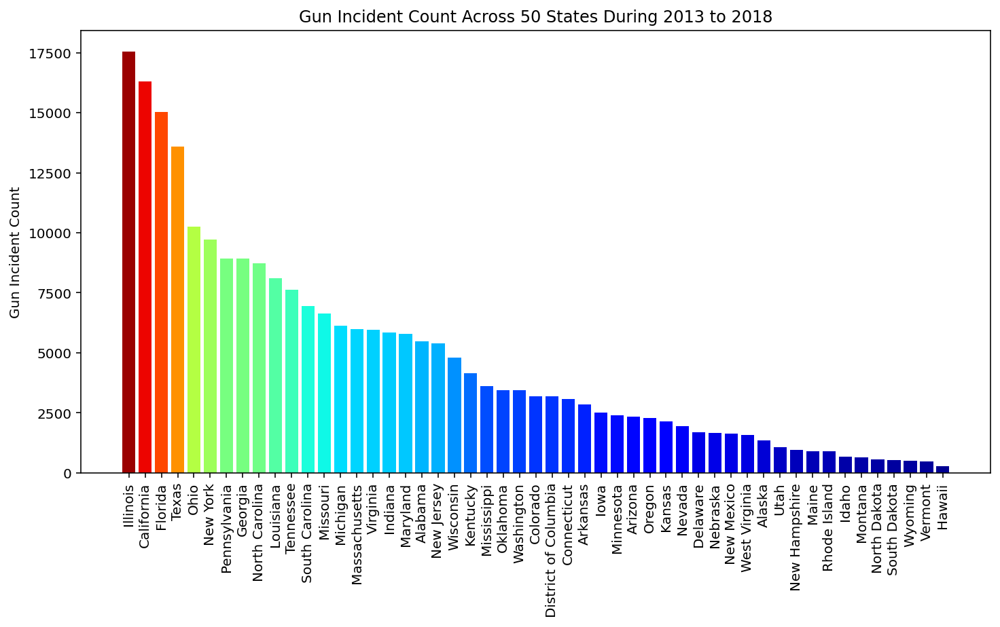

In [62]:
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

# Example data
state_name = state_violence_cnt['state']
x_pos = np.arange(len(state_name))
count = state_violence_cnt['incident_cnt']

my_cmap = cm.get_cmap('jet')
# get normalize function (takes data in range [vmin, vmax] -> [0, 1])
my_norm = Normalize(vmin=0, vmax=18000)
ax.bar(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_xticks(x_pos)
ax.set_xticklabels(state_name)
ax.set_ylabel('Gun Incident Count')
ax.set_title('Gun Incident Count Across 50 States During 2013 to 2018')
ax.tick_params(axis='x', rotation=90)

plt.show()

Above barplot paints a grim picture for few states, which recorded huge number of gun violence incidents; Illinois followed by California and Florida. It is easy to see that least populated states such as Hawaii, Vermont and North Dakota registered significantly small number of gun violence incidents during 2013 - 2018.  Next we'll break down by year the trend for the top 4 states.

Since states have different populations, it will be interesing to see the population adjusted data for each state.

In [63]:
crime_popn_data = pd.merge(left=state_violence_cnt, right=popn_data, left_on='state', right_on='NAME', how='inner')
crime_popn_data=crime_popn_data[['state','incident_cnt','2013']]
crime_popn_data.head(3)

,state,incident_cnt,2013
0,Illinois,17556,12895129
1,California,16306,38260787
2,Florida,15029,19545621


In [64]:
# incident counts per 100000 people
crime_popn_data['incidents_per_100000']=np.round((crime_popn_data['incident_cnt']/crime_popn_data['2013'])*100000,2)
crime_popn_data.head(4);

In [65]:
#obtain mean lattitude and longitude for the states

state_loc = violence_new.groupby('state').mean()[['latitude','longitude']]
state_loc = state_loc.reset_index()
state_loc;

In [66]:
joined_data_state = pd.merge(left = state_loc, right = crime_popn_data, left_on='state', right_on= 'state',\
                             how='inner')
joined_data_state.columns;

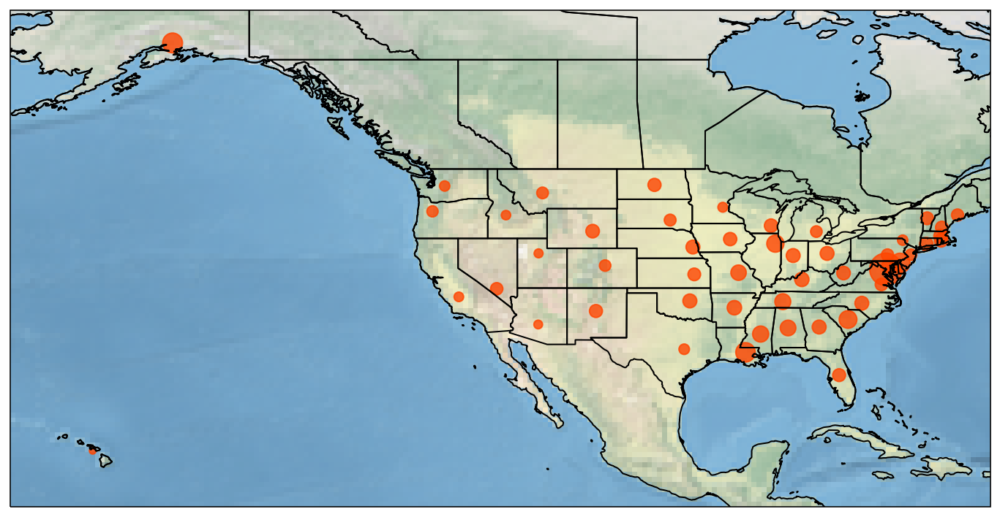

In [67]:
fig = plt.figure(figsize=(12,10))

ax = fig.add_subplot(1,1,1, projection=crs.PlateCarree())

ax.stock_img()
ax.coastlines()
ax.add_feature(cfeature.STATES)

ax.set_extent([-165, -66.5, 15, 65],
              crs=crs.PlateCarree()) ## Important


plt.scatter(x=joined_data_state.longitude, y=joined_data_state.latitude,
            color="orangered",
            s=joined_data_state.incidents_per_100000,
            alpha=0.8,
            transform=crs.PlateCarree()) ## Important

plt.show()

Going by the above map, Washingto DC seems to have high frequency of gun violence incidents per 100000 people.

In [68]:
joined_data_state.sort_values(by=['incidents_per_100000'], axis=0, ascending=False, inplace=True)
joined_data_state;



#### Most Unsafe States

In [69]:
unsafe_4_states = violence_new[violence_new['state'].\
                            isin (['Illinois','California','Florida','Texas'])]
unsafe_4_cnt=pd.Series.to_frame(unsafe_4_states.groupby(['state','year'])['incident_id'].count())
unsafe_4_cnt = unsafe_4_cnt.reset_index()
unsafe_4_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)
unsafe_4_yearly_cnt = unsafe_4_cnt[unsafe_4_cnt['incident_cnt']>0]
unsafe_4_yearly_cnt;

In [70]:
unsafe_4_yearly_cnt["state"] = unsafe_4_yearly_cnt["state"].astype("object")

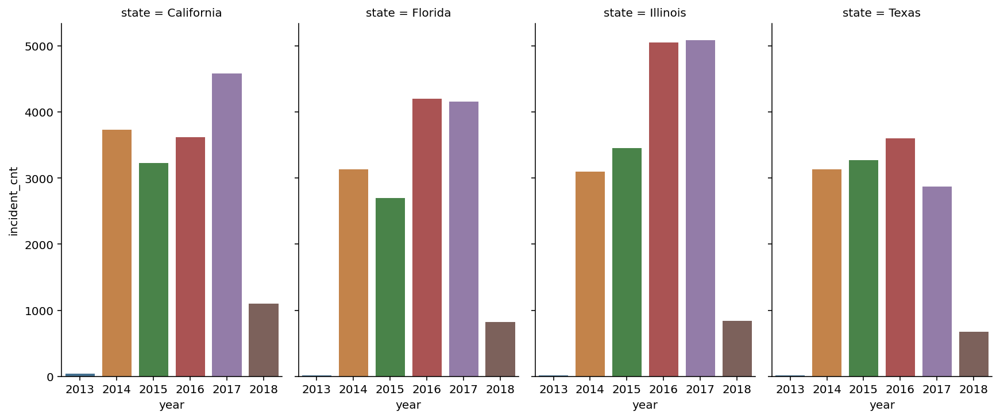

In [71]:
g = sns.catplot(x="year", y="incident_cnt", col='state',
                 data=unsafe_4_yearly_cnt, saturation=.5,
                 kind="bar", ci=None, aspect=.6)


Looking more carefully at the trend in thess states, we see that years 2016 and 2017 have relatively been notorius for all the 4 states. Unfortunately, `Illinois` is the most unsafe. We'll read in states population data to normalize the gun incidents per 100000 people and see their trend across the years.

In [72]:
#next filter rows only for top 4 unsafe states
unsafe_states_popn = popn_data_reshaped[popn_data_reshaped['NAME'].isin(['Texas', 'California','Illinois','Florida']
                                                                       )]
unsafe_states_popn.rename(columns={'variable':'year','value':'year_popn'},inplace=True)

In [73]:
#Before joining make sure that datatypes are matching 
unsafe_4_yearly_cnt['year'] = unsafe_4_yearly_cnt['year'].astype('str')

In [74]:
popn_incident_data = pd.merge(left=unsafe_4_yearly_cnt, right=unsafe_states_popn, left_on=['state','year'], \
                              right_on=['NAME','year'],how='inner')
popn_incident_data.drop(columns=['NAME'],inplace=True)

In [75]:
popn_incident_data['Incidents per_100000']=(popn_incident_data['incident_cnt']/popn_incident_data['year_popn'])*100000
popn_incident_data['Incidents per_100000']=np.round(popn_incident_data['Incidents per_100000'],2)



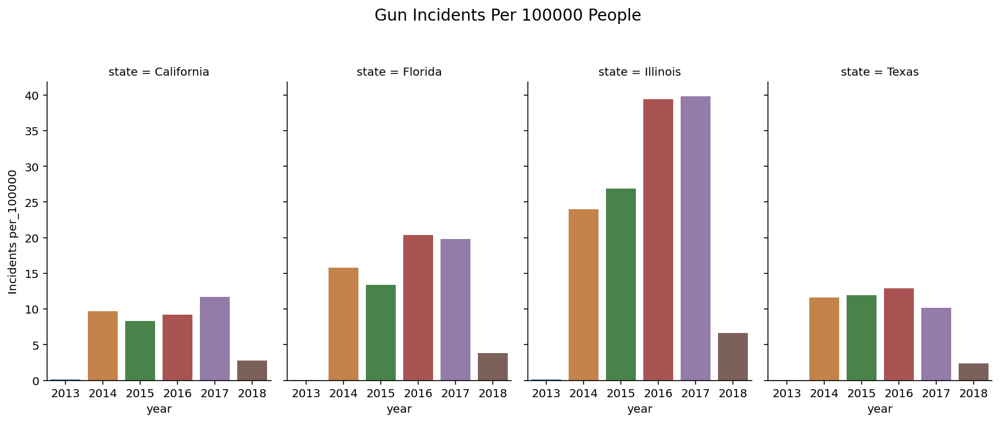

In [76]:
gnew = sns.catplot(x="year", y="Incidents per_100000", col='state',
                 data=popn_incident_data, saturation=.5,
                 kind="bar", ci=None, aspect=.6)
plt.subplots_adjust(top=0.8)
gnew.fig.suptitle('Gun Incidents Per 100000 People', fontsize=14)
plt.show()

Above barplot tells us that Illinois unfortunately dominates other 3 states in count of gun violence of incidents per 100000 people. In particular, years 2016 and 2017 have been really tragic. It will be informative to see are there any particular days which accounted for high number of violence inidents, as well as the locations where these incidents have occured the most. 
##### Biweekly Variation in Illinois in 2016 and 2017

In [77]:
#For years 2016 and 2017, find the daily count of gun violence incidents across Illinois 
illinois_2016 = violence_new[(violence_new['state']=='Illinois') & (violence_new['year'].isin([2016,2017]))]
daily_cnt_illinois = pd.Series.to_frame(illinois_2016.groupby(['date_time','year'])['incident_id'].count())
daily_cnt_illinois = daily_cnt_illinois.reset_index()
daily_cnt_illinois.rename(columns={'incident_id':'incident_cnt'}, inplace=True)

In [78]:
# filter data for years 2016 and 2017
year_2016=daily_cnt_illinois[daily_cnt_illinois['year']==2016]
year_2017=daily_cnt_illinois[daily_cnt_illinois['year']==2017]

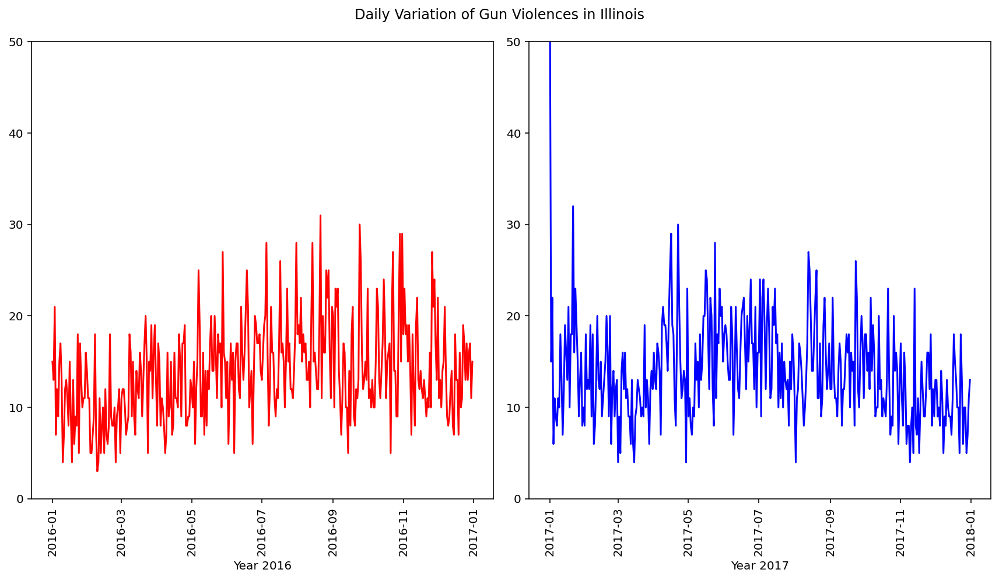

In [79]:
#Plot Daily Variations of Gun Incidents in 2016 and 2017

plt.figure(figsize=(12, 7))

plt.subplot(1, 2, 1)
plt.plot(year_2016.date_time, year_2016.incident_cnt,'red')
plt.xlabel('Year 2016')
#plt.title('Gun Violence ')
plt.xticks(rotation=90)
plt.ylim(0, 50)
plt.subplot(1, 2, 2)
plt.plot(year_2017.date_time, year_2017.incident_cnt, 'blue')
plt.xlabel('Year 2017')
#plt.title('Dew Point')
plt.xticks(rotation=90)
plt.ylim(0, 50)

plt.suptitle('Daily Variation of Gun Violences in Illinois')
plt.tight_layout()

plt.show()





We are not seeing a distinct daily pattern for state of Illinois across years 2016 and 2017. Since it is so noisy, it will be helpful to look at biweekly moving averages to get a trend in incident counts for both years 2016 and 2017. It will also help to smoothen the noise.

In [80]:
#Define a new column for biweekly average of Gun violence incidents in 2016 and 2017

year_2016['moving_avg_14'] = year_2016.iloc[:,2].rolling(window=14).mean()
year_2017['moving_avg_14'] = year_2017.iloc[:,2].rolling(window=14).mean()



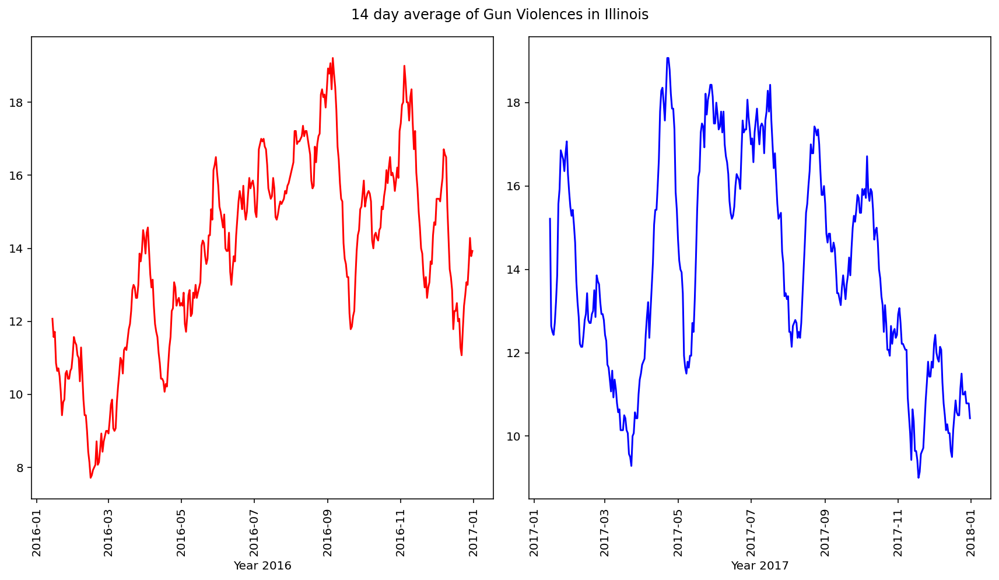

In [81]:
plt.figure(figsize=(12, 7))

plt.subplot(1, 2, 1)
plt.plot(year_2016.date_time, year_2016.moving_avg_14,'red')
plt.xlabel('Year 2016')
#plt.title('Gun Violence ')
plt.xticks(rotation=90)
#plt.ylim(0, 50)
plt.subplot(1, 2, 2)
plt.plot(year_2017.date_time, year_2017.moving_avg_14, 'blue')
plt.xlabel('Year 2017')
#plt.title('Dew Point')
plt.xticks(rotation=90)
#plt.ylim(0, 50)

plt.suptitle('14 day average of Gun Violences in Illinois')
plt.tight_layout()

plt.show()

Above plots gives us some nice insights; that compared to the year of 2016,winter months were quite peaceful in 2017. Moreover, summer months show high rate of gun violence incidents during both the years. 
##### Places of Conflicts in Illinois
Next we'll look at the cities of Illinois, which account for high number of gun violence incidents.

In [82]:
#During 2016 and 2017, get the count of gun violence incidents across cities of Illinois

city_incident_cnt = pd.Series.to_frame(illinois_2016.groupby(['city_or_county'])['incident_id'].count())
city_incident_cnt = city_incident_cnt.reset_index()
city_incident_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)

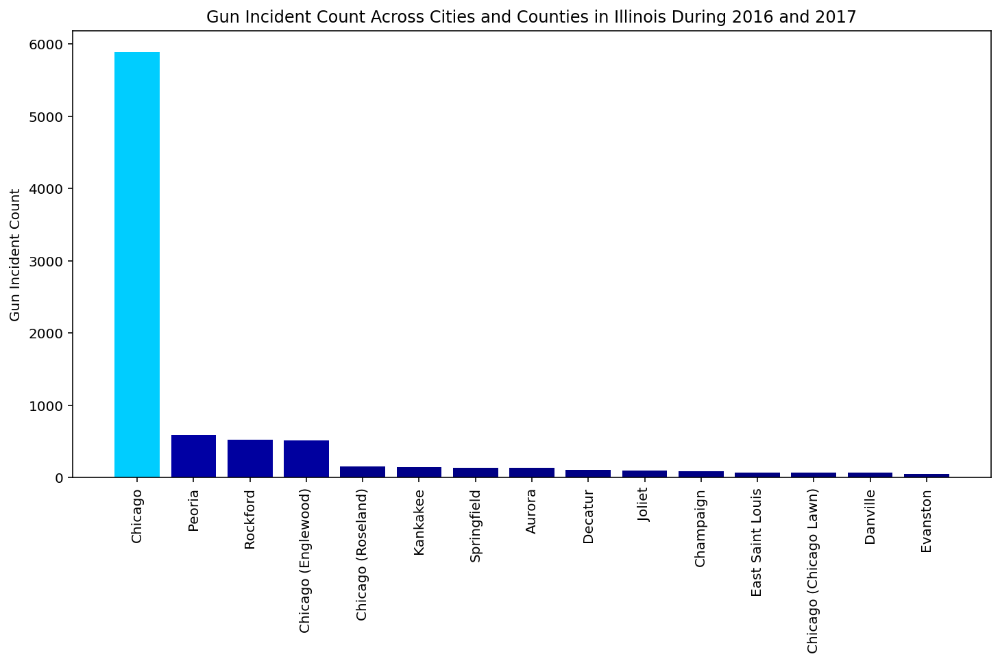

In [83]:

#look at 15 notorious cities in terms of gun violence incidents
top15_cities_illinois = city_incident_cnt.nlargest(15, 'incident_cnt')

fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)

# Example data
city_name = top15_cities_illinois['city_or_county']
x_pos = np.arange(len(city_name))
count = top15_cities_illinois['incident_cnt']

my_cmap = cm.get_cmap('jet')
# get normalize function (takes data in range [vmin, vmax] -> [0, 1])
my_norm = Normalize(vmin=0, vmax=18000)
ax.bar(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_xticks(x_pos)
ax.set_xticklabels(city_name)
ax.set_ylabel('Gun Incident Count')
ax.set_title('Gun Incident Count Across Cities and Counties in Illinois During 2016 and 2017')
ax.tick_params(axis='x', rotation=90)

plt.show()

Unsurprisingly, Chicago is the most notorius place in Illinois owing to its metropolitan structure and diversity. Since size and population of Chicago is significantly larger than other cities in Chicago, this comparison is not so meaningful.  

Along the same lines, we'll do a citywide comparison across all the states to identify the most unsafe cities during this time period.
### Unsafe Cities Across US




In [84]:
#Obtain count of gun violence incidents for each city in the dataset

incident_cnt_city = pd.Series.to_frame(violence_new.groupby(['city_or_county'])['incident_id'].count())
incident_cnt_city = incident_cnt_city.reset_index()
incident_cnt_city.rename(columns={'incident_id':'incident_cnt'}, inplace=True)

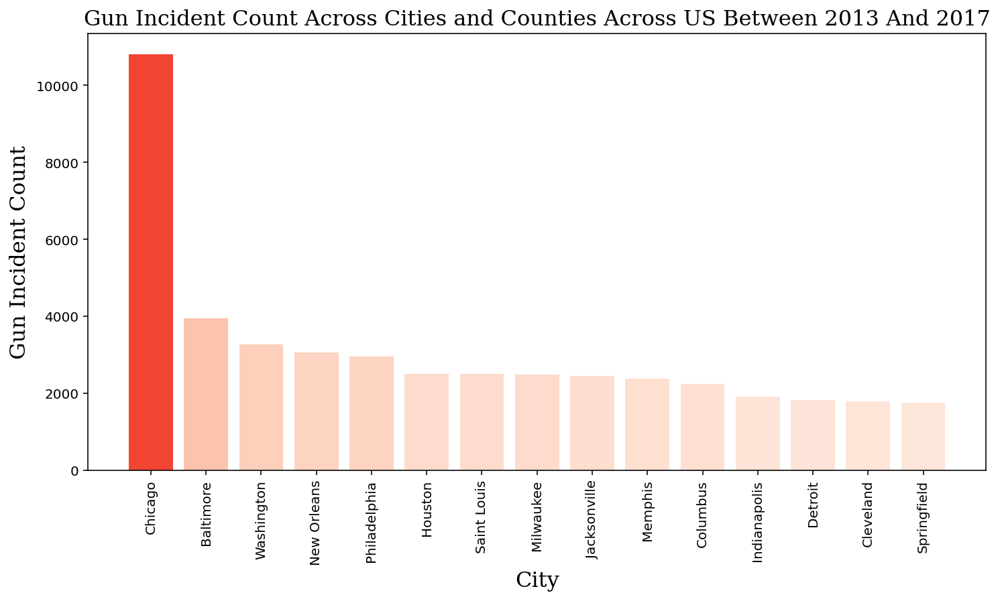

In [85]:
#look at top 15 cities in terms of gun incident counts

top15_cities = incident_cnt_city.nlargest(15, 'incident_cnt')

fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }
# Example data
city_name = top15_cities['city_or_county']
x_pos = np.arange(len(city_name))
count = top15_cities['incident_cnt']

my_cmap = cm.get_cmap('Reds')
# get normalize function (takes data in range [vmin, vmax] -> [0, 1])
my_norm = Normalize(vmin=0, vmax=18000)
ax.bar(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_xticks(x_pos)
ax.set_xticklabels(city_name)
ax.set_ylabel('Gun Incident Count', fontdict=font)
ax.set_xlabel('City', fontdict=font)
ax.set_title('Gun Incident Count Across Cities and Counties Across US Between 2013 And 2017', fontdict = font)
ax.tick_params(axis='x', rotation=90)

plt.show()

It seems Chicago is leading heavily in terms of gun violences. But these cities have significant different population, hence we shd look at population adjusted values, e.g. gun violences per 100000 people.

In [86]:
#since some states in US have identical city names, it is beneficial to group by city as well as state

city_state_cnt = pd.Series.to_frame(violence_new.groupby(['city_or_county','state'])['incident_id'].count())
city_state_cnt = city_state_cnt.reset_index()
city_state_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)
city_state_cnt.head(10);

In [87]:
#sort the top 15 cities
top15_cities_state = city_state_cnt.nlargest(15, 'incident_cnt')
top15_cities_state;

In [88]:
# join to get population data also for those cities
violent_cities_popn = pd.merge(left = top15_cities_state, right = city_popn, how='inner', \
                               left_on = ['city_or_county','state'] ,right_on = ['City','State'])

In [89]:
# Obtain the gun-violence counts per 100000 people in these cities

violent_cities_popn['Population'] = violent_cities_popn['Population'].str.replace(',','').astype('int32')
violent_cities_popn['incidents_100000']=(violent_cities_popn['incident_cnt']/violent_cities_popn['Population'])*100000
violent_cities_popn['incidents_100000'] = np.round(violent_cities_popn['incidents_100000'],2)

In [90]:
#Calculate overall gun incident count per 100000 people in US

threshold = round((violence_new['incident_id'].count()/300000000)*100000,2)
threshold;

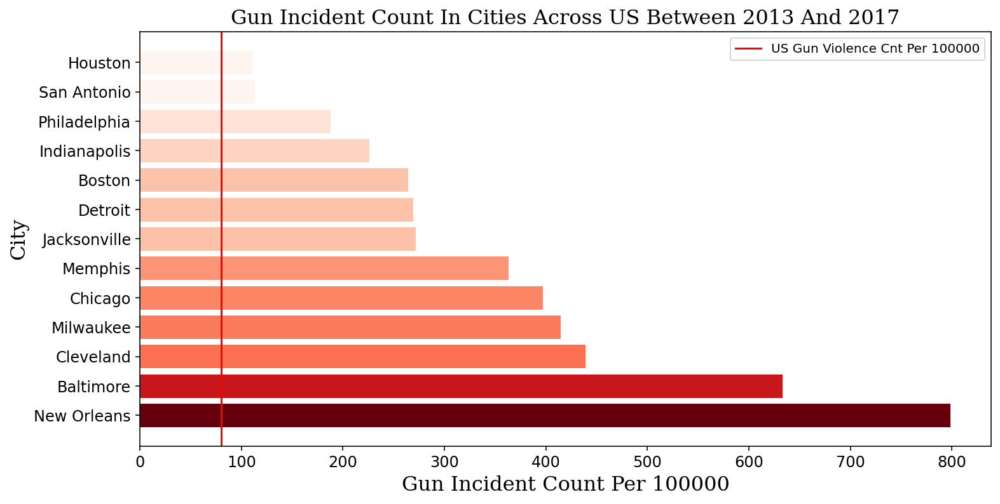

In [91]:
violent_cities_popn.sort_values(by=['incidents_100000'], axis=0, ascending=False, inplace=True)



fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }

city_name = violent_cities_popn['City']
x_pos = np.arange(len(city_name))
count = violent_cities_popn['incidents_100000']

my_cmap = cm.get_cmap('Reds')
# get normalize function (takes data and scales the data in range [0, 1])
my_norm = Normalize(vmin=min(count), vmax=max(count))
ax.barh(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_yticks(x_pos)
ax.set_yticklabels(city_name)
ax.set_xlabel('Gun Incident Count Per 100000', fontdict=font)
ax.set_ylabel('City', fontdict=font)
ax.set_title('Gun Incident Count In Cities Across US Between 2013 And 2017', fontdict=font)
ax.tick_params(axis='x', rotation=0, labelsize=12)
ax.tick_params(axis='y', labelsize=12)
plt.axvline(x=threshold, color='r', linestyle='-', label='US Gun Violence Cnt Per 100000')
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper right')
plt.show()

From above plot, we see that New Orleans is leading the country when we look at prevalence of gun violence incidents on adjusted population. Moreover, few cities are leading the national average by more than five times.
Next, it'll be interesting to look at the gun violence trend for the most unsafe cities. Are the cities getting better with time?

In [92]:
# First, we'll find the incident count for these unsafe cities per year

top6_cities = violence_new[violence_new['city_or_county'].isin(['Baltimore','New Orleans','Cleveland',\
                                                                'Milwaukee','Chicago','Memphis'])]
top6_city_state_year_cnt = pd.Series.to_frame(top6_cities.groupby(['city_or_county','state','year'])['incident_id'].count())
top6_city_state_year_cnt = top6_city_state_year_cnt.reset_index()
top6_city_state_year_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)
top6_city_state_year_cnt.head(10);

In [93]:
# Next, we join to city_popn data in order to gather population information together with incident count

top6violent_cities_popn = pd.merge(left = top6_city_state_year_cnt, right = city_popn, how='inner', \
                                   left_on = ['city_or_county','state'] ,right_on = ['City','State'])
top6violent_cities_popn['Population'] = top6violent_cities_popn['Population'].str.replace(',','').astype('int32')

In [94]:
# Calculate the incident count per 100000

top6violent_cities_popn['incidents_100000']=(top6violent_cities_popn['incident_cnt']/top6violent_cities_popn['Population'])*100000
top6violent_cities_popn['incidents_100000']= np.round(top6violent_cities_popn['incidents_100000'],2)

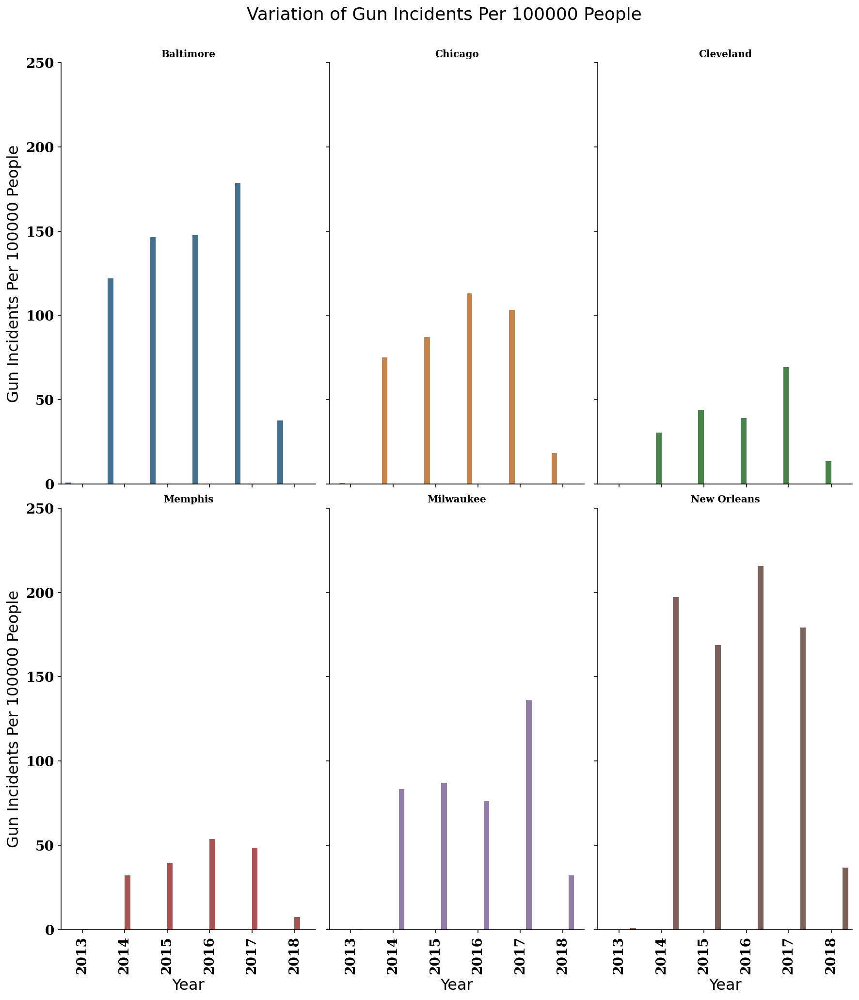

In [95]:
gnew2 = sns.catplot(x="year", y="incidents_100000", hue='City', col='City',col_wrap=3,
                 data=top6violent_cities_popn, saturation=.5,
                 kind="bar", ci=None, height = 8, aspect=.5)
font = {'family': 'serif',
        'weight': 'bold',
        'size': 14,
        'rotation':90
        }
fontnew = {'family': 'serif',
        'weight': 'bold',
        'size': 14
        }
plt.subplots_adjust(top=0.8)
gnew2.fig.suptitle('Variation of Gun Incidents Per 100000 People', y=0.85,fontsize=18)
gnew2.set_xlabels('Year', fontsize=16)
gnew2.set_ylabels('Gun Incidents Per 100000 People', fontsize=16)
gnew2.set_xticklabels(fontdict=font)
gnew2.set_yticklabels(labels=[0,50,100,150,200,250],fontdict=fontnew)
#gnew2.set(ylim=(0,250))
gnew2.set_titles(col_template='{col_name}', fontdict=fontnew)
plt.show()

From the above barchart, we're not seeing any noticeable trend in gun violence counts for New Orleans as well as Chicago. On the contrary, few cities paint a very grim picture; first, Baltimore saw an increasing trend in gun violence incidents, second, Milwaukee and Cleveland were quite safe except for the year 2017.

Along the same lines, we'll look at the annual percentage change in gun violence incidents for the staes across the years. Since we don't have enough data for 2018, we'll omit that year for this purpose. 
 

In [96]:
violence_new_2018 = violence_new.copy()
violence_new_2018['year'] = violence_new_2018['year'].astype('str')
violence_new_2018= violence_new_2018[violence_new_2018['year']!='2018']
violence_new_2018[violence_new_2018['year']=='2018'].shape;

In [97]:
# group by state and year to get incident count

year_state_cnt = violence_new_2018.groupby(['state','year'])['incident_id'].count()
year_state_cnt = year_state_cnt.reset_index()
year_state_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)

In [98]:
#next join the data with the state popn.

state_popn_year_incident_cnt = pd.merge(left=year_state_cnt, right = popn_data, how='inner', \
                                   left_on = ['state'] ,right_on = ['NAME'])
state_popn_year_incident_cnt = state_popn_year_incident_cnt[['state','year','2013','incident_cnt']]
state_popn_year_incident_cnt.shape

(255, 4)

In [99]:
state_popn_year_incident_cnt['cnt_per_100000'] = np.round((state_popn_year_incident_cnt['incident_cnt']/state_popn_year_incident_cnt['2013'])*100000,2)
state_popn_year_cnt = state_popn_year_incident_cnt[['state','year','cnt_per_100000']]
state_popn_year_cnt = state_popn_year_cnt.pivot(index='state',columns='year',values='cnt_per_100000')
state_popn_year_cnt = state_popn_year_cnt.reset_index()
state_popn_year_cnt;

In [100]:
#find the lift of gun violences for states excluding years 2013, since 2013 has significanlty small number of
# incidents

state_popn_year_cnt['2014_2015'] = np.round(((state_popn_year_cnt['2015']-state_popn_year_cnt['2014'])/state_popn_year_cnt['2014'])*100,2)
state_popn_year_cnt['2015_2016'] = np.round(((state_popn_year_cnt['2016']-state_popn_year_cnt['2015'])/state_popn_year_cnt['2015'])*100,2)
state_popn_year_cnt['2016_2017'] = np.round(((state_popn_year_cnt['2017']-state_popn_year_cnt['2016'])/state_popn_year_cnt['2016'])*100,2)

In [101]:
state_popn_year_cnt[state_popn_year_cnt['state']=='Vermont']

year,state,2013,2014,2015,2016,2017,2014_2015,2015_2016,2016_2017
45,Vermont,0.0,27.15,18.68,15.01,11.34,-31.2,-19.65,-24.45


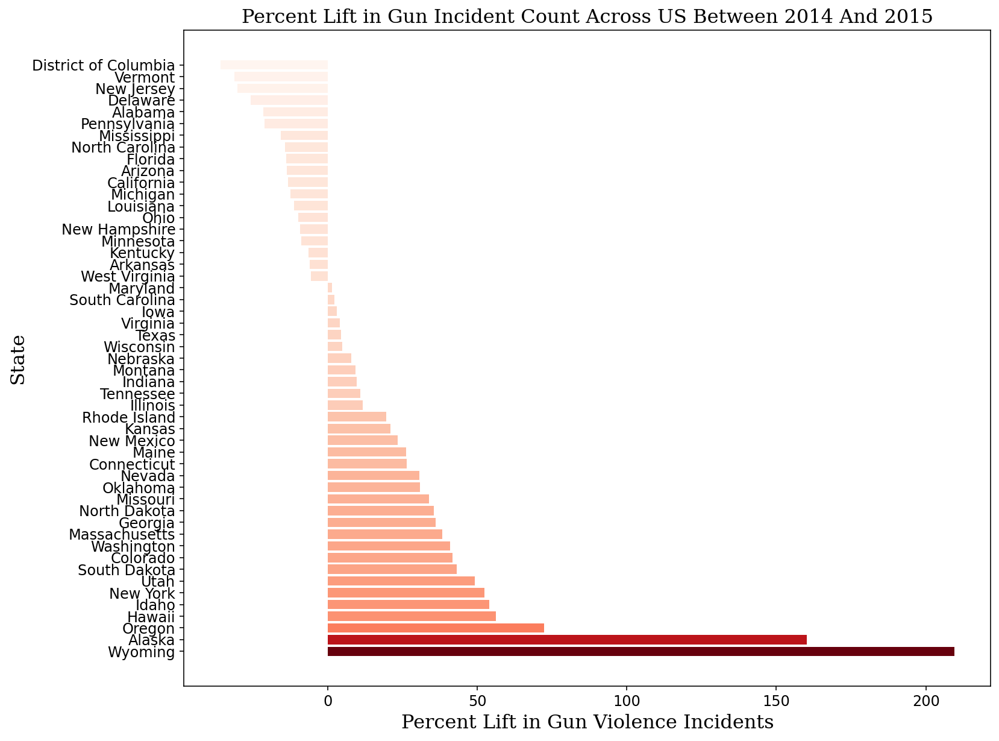

In [102]:
state_2014_2015_growth_rate = state_popn_year_cnt.sort_values(by=['2014_2015'], axis=0, ascending=False)



fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }

state_name = state_2014_2015_growth_rate['state']
x_pos = np.arange(len(state_name))
count = state_2014_2015_growth_rate['2014_2015']

my_cmap = cm.get_cmap('Reds')
# get normalize function (takes data and scales the data in range [0, 1])
my_norm = Normalize(vmin=min(count), vmax=max(count))
ax.barh(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_yticks(x_pos)
ax.set_yticklabels(state_name)
ax.set_xlabel('Percent Lift in Gun Violence Incidents', fontdict=font)
ax.set_ylabel('State', fontdict=font)
ax.set_title('Percent Lift in Gun Incident Count Across US Between 2014 And 2015', fontdict=font)
ax.tick_params(axis='x', rotation=0, labelsize=12)
ax.tick_params(axis='y', labelsize=12)
#plt.axvline(x=threshold, color='r', linestyle='-', label='US Gun Violence Cnt Per 100000')
#plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper right')
plt.show()

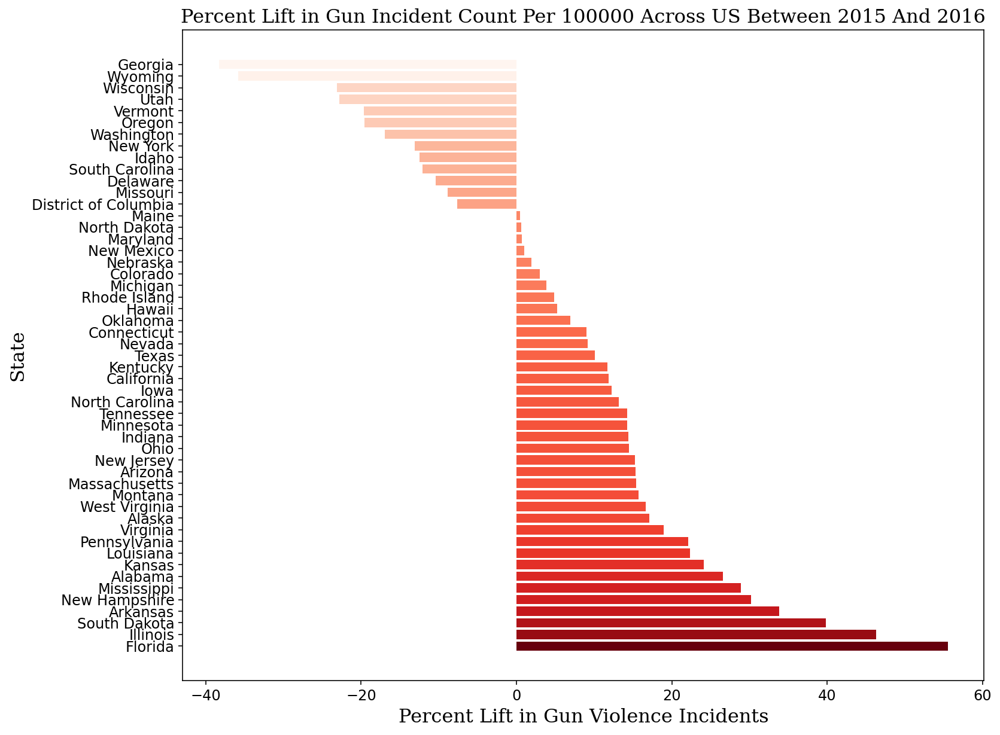

In [103]:
state_2015_2016_growth_rate = state_popn_year_cnt.sort_values(by=['2015_2016'], axis=0, ascending=False)



fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }

state_name = state_2015_2016_growth_rate['state']
x_pos = np.arange(len(state_name))
count = state_2015_2016_growth_rate['2015_2016']

my_cmap = cm.get_cmap('Reds')
# get normalize function (takes data and scales the data in range [0, 1])
my_norm = Normalize(vmin=min(count), vmax=max(count))
ax.barh(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_yticks(x_pos)
ax.set_yticklabels(state_name)
ax.set_xlabel('Percent Lift in Gun Violence Incidents', fontdict=font)
ax.set_ylabel('State', fontdict=font)
ax.set_title('Percent Lift in Gun Incident Count Per 100000 Across US Between 2015 And 2016', fontdict=font)
ax.tick_params(axis='x', rotation=0, labelsize=12)
ax.tick_params(axis='y', labelsize=12)
#plt.axvline(x=threshold, color='r', linestyle='-', label='US Gun Violence Cnt Per 100000')
#plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper right')
plt.show()

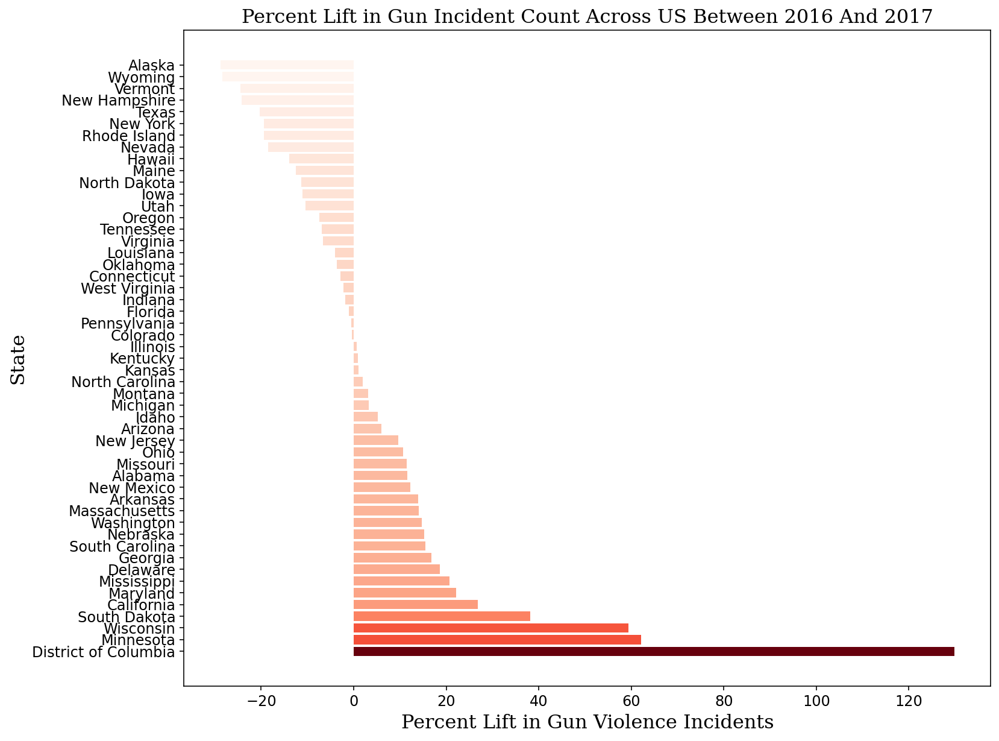

In [104]:
state_2016_2017_growth_rate = state_popn_year_cnt.sort_values(by=['2016_2017'], axis=0, ascending=False)



fig = plt.figure(figsize=(12,10))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }

state_name = state_2016_2017_growth_rate['state']
x_pos = np.arange(len(state_name))
count = state_2016_2017_growth_rate['2016_2017']

my_cmap = cm.get_cmap('Reds')
# get normalize function (takes data and scales the data in range [0, 1])
my_norm = Normalize(vmin=min(count), vmax=max(count))
ax.barh(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_yticks(x_pos)
ax.set_yticklabels(state_name)
ax.set_xlabel('Percent Lift in Gun Violence Incidents', fontdict=font)
ax.set_ylabel('State', fontdict=font)
ax.set_title('Percent Lift in Gun Incident Count Across US Between 2016 And 2017', fontdict=font)
ax.tick_params(axis='x', rotation=0, labelsize=12)
ax.tick_params(axis='y', labelsize=12)
#plt.axvline(x=threshold, color='r', linestyle='-', label='US Gun Violence Cnt Per 100000')
#plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper right')
plt.show()

### Gun Violence Prevalence Across Cities of Different Sizes
Is the change in rate of incidents similar across cities of all sizes? It will be interesting to look at rate of gun violence incidents for cities, of following sizes; less than 50000 people, 50000-99999 people, 100000-249999 people, 250000-499999, 500000-999999, and 1 million or more.

In [105]:
city_popn_fill = city_popn.dropna(how='any')
city_popn_fill.isna().sum()

State         0
City          0
Population    0
dtype: int64

In [106]:
city_popn_fill['Population'] = city_popn_fill['Population'].str.replace(',','').astype('int32')
city_popn_fill.head(4);

In [107]:
city_popn_fill['popn_range'] = city_popn_fill['Population'].swifter.progress_bar(False).apply(lambda x:'Fewer Than 50,000' if x<50000\
                                                                                             else('50,000-99,999' if 50000<=x<100000\
                                                                                             else('100,000-249,999' if 100000<=x<250000\
                                                                                             else('250,000-499,999' if 2500000<=x<5000000\
                                                                                            else('500,000-999,999' if 500000<=x<1000000\
                                                                                            else '1 million or more')))))

city_popn_fill.head(10);

In [108]:
violence_new['month-year'] = violence_new['date_time'].dt.to_period('M')
violence_new[['date_time','month-year']].head(4);

In [109]:
violence_cities_popn_range = pd.merge(left = violence_new[['incident_id','city_or_county','state','year','month-year']],\
                                                right = city_popn_fill, how='inner', \
                                   left_on = ['city_or_county','state'] ,right_on = ['City','State'])

#violence_new.groupby(['state','city_or_county','month-year'])['incident_id'].count()

In [110]:
violence_cities_popn_range=violence_cities_popn_range[violence_cities_popn_range['year']!=2018]
popn_range_cnt = violence_cities_popn_range.groupby(['year','popn_range'])['incident_id'].count()
popn_range_cnt = popn_range_cnt.reset_index()
popn_range_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)

In [111]:
popn_range_total = city_popn_fill.groupby('popn_range')['Population'].sum()
popn_range_total = popn_range_total.reset_index()
popn_range_total.rename(columns={'Population':'Total_popn'}, inplace=True)

In [112]:
popn_range_incident_cnt = pd.merge(left=popn_range_cnt, right=popn_range_total, how='inner', left_on=['popn_range'],\
                                   right_on=['popn_range'])
popn_range_incident_cnt['incidents_per_100000'] = np.round((popn_range_incident_cnt['incident_cnt']/popn_range_incident_cnt['Total_popn'])*100000,\
                                                           2)
popn_range_incident_cnt.head(5);

In [113]:
popn_range_incident_cnt = popn_range_incident_cnt[['year','popn_range','incidents_per_100000']]
popn_range_incident_pivot = popn_range_incident_cnt.pivot(index=['popn_range'], columns='year', \
                                                          values='incidents_per_100000')
popn_range_incident_pivot

year,2013,2014,2015,2016,2017
popn_range,,,,,
1 million or more,0.14,21.42,19.32,21.16,19.98
"100,000-249,999",0.09,23.22,23.97,26.20,26.76
"250,000-499,999",0.27,28.96,33.44,39.31,36.13
"50,000-99,999",0.08,14.72,14.93,17.08,18.93
"500,000-999,999",0.17,30.59,34.00,36.88,40.01
"Fewer Than 50,000",0.04,9.99,10.43,11.42,12.92


### State Ranking of Death Rate Between 2013 And 2017

Gun violence is a sad reality in US. But the death rate is not uniform across US states. Next, we'll look at the death rate, normalozed for every 100000 people across US states and compare it to the country death rate


In [114]:
state_death_cnt = violence_new.groupby(['state'])['n_killed'].sum()
state_death_cnt = state_death_cnt.reset_index()
state_death_cnt.rename(columns={'n_killed':'killed_cnt'}, inplace=True)

In [115]:
state_death_cnt_popn = pd.merge(left=state_death_cnt, right= popn_data[['NAME','2013']], left_on=['state'],
        right_on=['NAME'], how='inner')
state_death_cnt_popn.shape;

In [116]:
state_death_cnt_popn.drop('NAME', axis=1, inplace=True)
state_death_cnt_popn['death_cnt_per_100000']= np.round((state_death_cnt_popn['killed_cnt']/state_death_cnt_popn['2013'])*100000,\
                                                      2)


In [117]:
#Calculate overall death count per 100000 people in US

threshold_new = round((violence_new['n_killed'].sum()/300000000)*100000,2)
threshold_new;

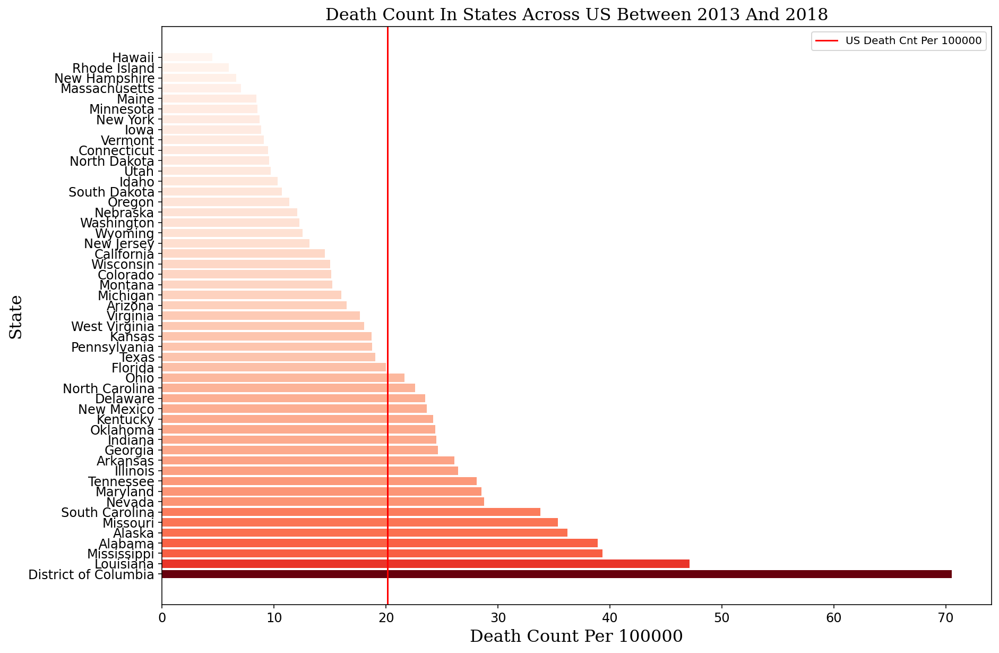

In [118]:
state_death_cnt_popn.sort_values(by=['death_cnt_per_100000'], axis=0, ascending=False, inplace=True)



fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }

state_name = state_death_cnt_popn['state']
x_pos = np.arange(len(state_name))
count = state_death_cnt_popn['death_cnt_per_100000']

my_cmap = cm.get_cmap('Reds')
# get normalize function (takes data and scales the data in range [0, 1])
my_norm = Normalize(vmin=min(count), vmax=max(count))
ax.barh(x_pos, count, align='center', color=my_cmap(my_norm(count)))
ax.set_yticks(x_pos)
ax.set_yticklabels(state_name)
ax.set_xlabel('Death Count Per 100000', fontdict=font)
ax.set_ylabel('State', fontdict=font)
ax.set_title('Death Count In States Across US Between 2013 And 2018', fontdict=font)
ax.tick_params(axis='x', rotation=0, labelsize=12)
ax.tick_params(axis='y', labelsize=12)
plt.axvline(x=threshold_new, color='r', linestyle='-', label='US Death Cnt Per 100000')
plt.legend(bbox_to_anchor = (1.0, 1), loc = 'upper right')
plt.show()

Looking at the above bar plots, District of Columbia, Lousiana, Missisippi rank in top 5 states with respect to death counts per 100000 people. On the other hand, Hawaii, Rhode Island, rank on the other end of spectrum.

### Gun Violence Count vs. Socioeconomic Conditions of the State
Do we see any correlation between gun count and per capita income of the state?

In [119]:
#combine violence data with income data

state_per_capita_violence_cnt = pd.merge(left = state_violence_cnt, right = state_per_capita, how='inner', \
                                   left_on = ['state'] ,right_on = ['State'])
state_per_capita_violence_cnt.drop(columns=['State'], axis=1, inplace=True)
state_per_capita_violence_cnt.head(2);

In [120]:
# retrieve population data also

state_per_capita_violence_popn_cnt = pd.merge(left = state_per_capita_violence_cnt, right = popn_data, how='inner', \
                                   left_on = ['state'] ,right_on = ['NAME'])
state_per_capita_violence_popn_cnt.drop(columns=['NAME','2013','2014','2015','2016','2017'], axis=1, inplace=True)
state_per_capita_violence_popn_cnt.head(2);

In [121]:
state_per_capita_violence_popn_cnt['Gun_incident_cnt_per_100000'] = np.round((state_per_capita_violence_popn_cnt['incident_cnt']/state_per_capita_violence_popn_cnt['2018'])*100000,\
                                                                            2)
state_per_capita_violence_popn_cnt.head(4);

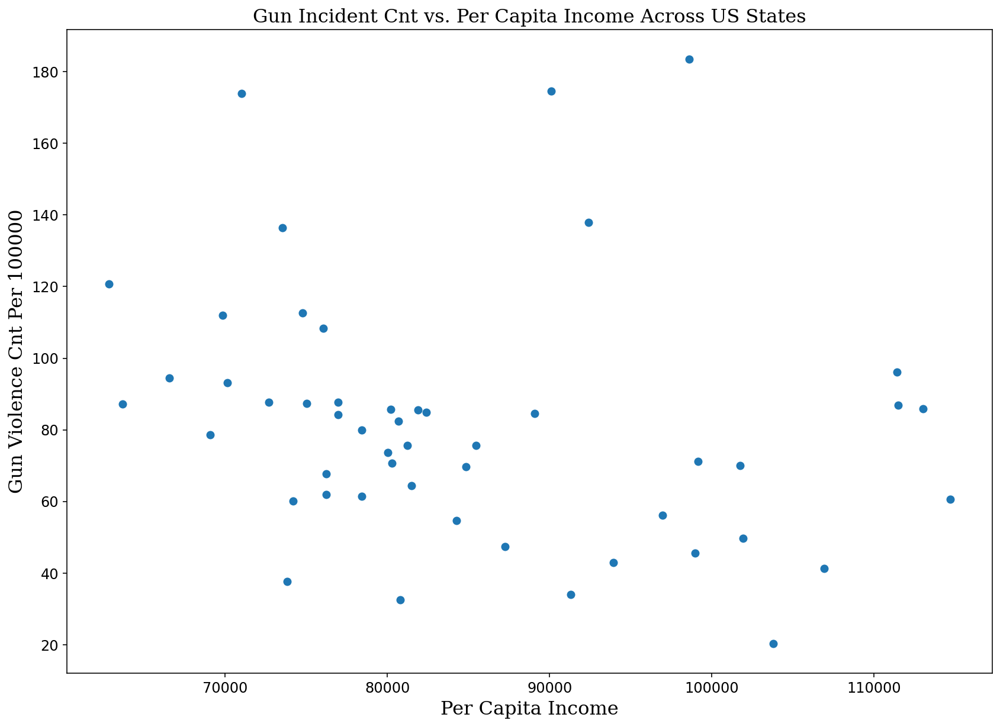

In [122]:
fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }
ax.scatter(state_per_capita_violence_popn_cnt['HouseholdIncome'], state_per_capita_violence_popn_cnt['Gun_incident_cnt_per_100000'])
ax.set_xlabel('Per Capita Income', fontdict=font)
ax.set_ylabel('Gun Violence Cnt Per 100000', fontdict=font)
ax.set_title('Gun Incident Cnt vs. Per Capita Income Across US States', fontdict=font)
ax.tick_params(axis='x', rotation=0, labelsize=12)
ax.tick_params(axis='y', labelsize=12)
plt.show()

Above scatter plot does not show any correlation between the gun violence counts in a state and the per capita income in that state. Along the same lines, do we see any correlation between unemployment rate and gun count in the states.

In [123]:
state_unemployment_gun_incident_cnt = pd.merge(left = state_per_capita_violence_popn_cnt, right = state_unemployment,\
                                              how='inner', left_on = ['state'] ,right_on = ['Area'])
state_unemployment_gun_incident_cnt.shape;


In [124]:
df2 = state_unemployment_gun_incident_cnt.sort_values(by=['Gun_incident_cnt_per_100000'], axis=0, \
                                                ascending=False)
df2.head(3);

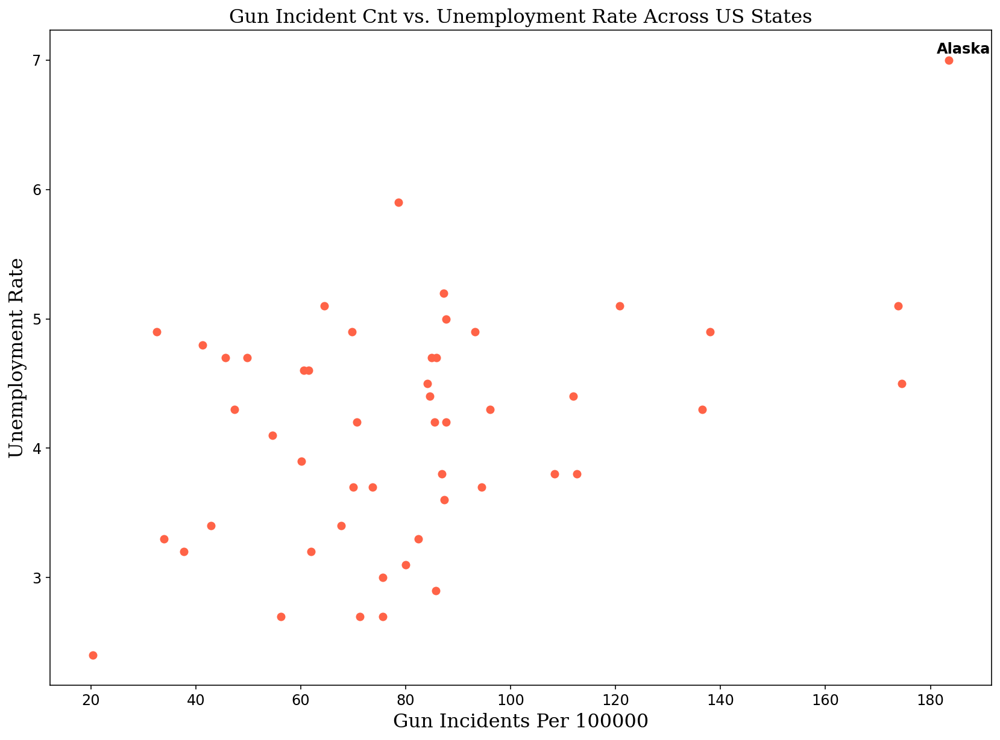

In [125]:
fig = plt.figure(figsize=(14,10))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }
ax.scatter(state_unemployment_gun_incident_cnt['Gun_incident_cnt_per_100000'],state_unemployment_gun_incident_cnt['2017'],\
          color='tomato')
ax.set_xlabel('Gun Incidents Per 100000', fontdict=font)
ax.set_ylabel('Unemployment Rate', fontdict=font)
ax.set_title('Gun Incident Cnt vs. Unemployment Rate Across US States', fontdict=font)
ax.tick_params(axis='x', rotation=0, labelsize=12)
ax.tick_params(axis='y', labelsize=12)
ax.annotate('Alaska',             # The label for this point
                xy=(183.5, 7), # Position of the corresponding point
                xytext=(-10, 9),     # Offset text by 7 points to the right
                textcoords='offset points', # tell it to use offset points
                ha='left',         # Horizontally aligned to the left
                va='center',
                   weight ='bold',
           fontsize=12) 
plt.show()

We observe reasonably positive correlation betwee the Gun Incident cnt and Unemployment Rate Across US states, which is evident by the Pearson correlation calculated in next cell. Most of the data points are within a reasonable range, except Alaska. It records highest unemployment rate as well as significantly high rate of gun incident counts.

In [126]:
state_unemployment_gun_incident_cnt['Gun_incident_cnt_per_100000'].corr(state_unemployment_gun_incident_cnt['2017'])

0.43897304456067865





### Notorious Days of the Week

It will be interesting to see the days on which violent acts are more frequent in these cities; weekends vs. weekday.

In [127]:
#Define a new column to identify weekend vs. weekday 
violence_new['weekend_vs_weekday']=violence_new['day_name'].swifter.progress_bar(False).apply(lambda x: 'Weekday' if x in ('Tuesday','Monday','Wednesday',\
                                                                                    'Friday','Thursday') else 'Weekend')

In [128]:
#Obtain the count of gun incidnets for a given city and weekday
city_state_weekday_cnt = violence_new.groupby(['state','city_or_county','weekend_vs_weekday'])['incident_id'].count()
city_state_weekday_cnt = city_state_weekday_cnt.reset_index()
city_state_weekday_cnt.rename(columns={'incident_id':'incident_cnt'}, inplace=True)

Earlier, we had the dataset `violent_cities_popn`, whih has the incident count for a given cty and state during the period 2013 through 2017. Next, we'll join with `city_state_weekday_cnt` to get information regarding total incident cnt, as well as incident counts on weekday and on weekends. 

In [129]:
#merge the data with the overall incident count data to get all data together

violent_cities_weekday_cnt = pd.merge(left=city_state_weekday_cnt, right = violent_cities_popn, how='inner', \
                                   left_on = ['city_or_county','state'] ,right_on = ['City','State'])
violent_cities_weekday_cnt.drop(columns=['city_or_county_y','state_y','State','City','Population', 'incidents_100000'],\
                               inplace=True)
violent_cities_weekday_cnt.rename(columns={'state_x':'State','city_or_county_x':'City','incident_cnt_x':'weekday_cnt',\
                                          'incident_cnt_y':'Total_cnt'},inplace=True)
violent_cities_weekday_cnt.shape;

In [130]:
#Calculate percent of incidents during weekday vs weekends
violent_cities_weekday_cnt['Incident_percent']=np.round((violent_cities_weekday_cnt['weekday_cnt']/violent_cities_weekday_cnt['Total_cnt'])*100,2)
violent_cities_weekday_cnt.head(4);

In [131]:
#select only relevant columns for city name, weekday and percent of incidents

df2 = violent_cities_weekday_cnt[['City','weekend_vs_weekday','Incident_percent']]
df2 = df2.pivot(index=['City'], columns='weekend_vs_weekday', values='Incident_percent')
df2 = df2.reset_index()
df2;

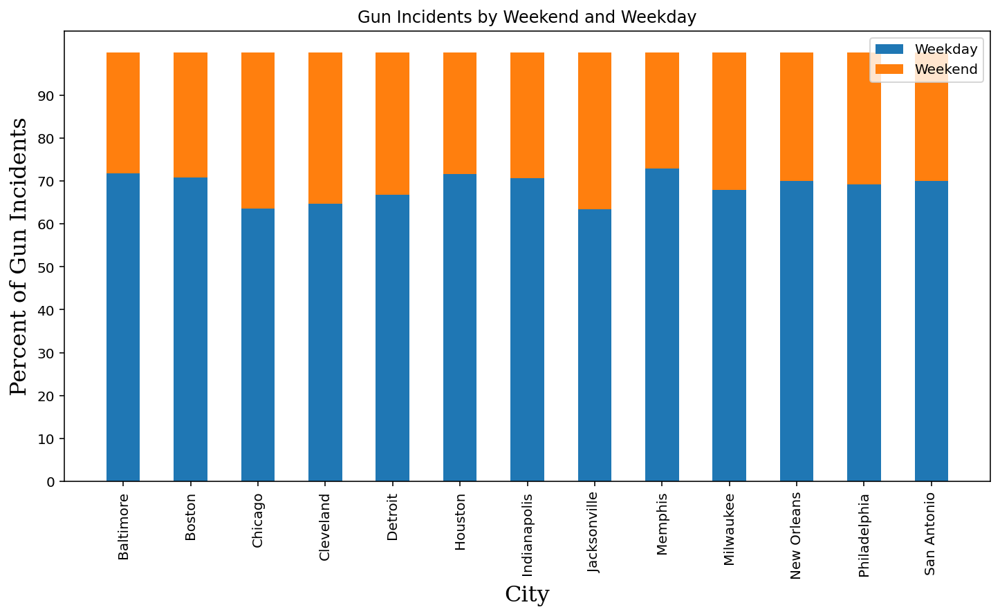

In [132]:
fig = plt.figure(figsize=(12,6))
ax = fig.add_subplot(111)
font = {'family': 'serif',
        'weight': 'normal',
        'size': 16,
        }

city_name = df2['City']
x_pos = np.arange(len(city_name))
weekday_count = df2['Weekday']
weekend_count = df2['Weekend']
width = 0.5

p1 = plt.bar(x_pos, weekday_count, width)
p2 = plt.bar(x_pos, weekend_count, width,
             bottom=weekday_count)

plt.ylabel('Percent of Gun Incidents',fontdict=font)
plt.xlabel('City',fontdict=font)
plt.title('Gun Incidents by Weekend and Weekday')
plt.xticks(x_pos,labels=city_name,rotation=90)
plt.yticks(np.arange(0, 100, 10))
plt.legend((p1[0], p2[0]), ('Weekday', 'Weekend'),loc='best')

plt.show()



Above barchart does not show much noticeable difference among the cities. For each city, around 70 percent of gun incidents occur on weekdays and almost 30 percent on weekends. 

In above two sections, we tried to identify trend of gun violence incidents across different states as well as cities across the country. In particular, we identified the most unsafe as well as safe states. 

Next, we identified the top 5 unsafe cities across the country. Next, we'll look at demographics of participants involved in the incident. To begin with, we'll investigate the participation of Teens in these incidents. As before, we'll take a top down approach; first look at overall level of participation of teens in incidents across the country. This will be followed by investigating the participation of teens as suspects in the unsafe places identified above. It'll be helpful to compare the level of participation of teens in cities as compared to national average. 

### How Likely are the Teens to Engage in Gun Violence?

There are few data points, for which we don't have information regarding the total count of suspects or total victims. Those records need investigation; imputing them might not be a suitable idea. Since we can't be very sure about count of suspects. Dropping those rows might be one option.

In [133]:
# Define a new column which gives proportion of Teens involved in the incident. make sure to filter data with 
#nonzero suspect count

violence_new2 = violence_new.copy()
violence_new2 = violence_new2[violence_new2['Suspect_cnt']!=0] 

violence_new2['Teen_suspect_pct'] = np.round((violence_new2['Teen_suspect'])/(violence_new2['Suspect_cnt']),\
                                    2)
violence_new2.tail(5);


In [134]:
violence_new2['year'] = violence_new2['year'].astype('category')
violence_new2['year'].dtype;

In [135]:
violence_cities_popn_range_teen_participation = pd.merge(left = violence_new2[['incident_id','city_or_county','state','year','Teen_suspect_pct','Teen_Victim']],\
                                                right = city_popn_fill, how='inner', \
                                   left_on = ['city_or_county','state'] ,right_on = ['City','State'])
violence_cities_popn_range_teen_participation.columns

Index(['incident_id', 'city_or_county', 'state', 'year', 'Teen_suspect_pct',
       'Teen_Victim', 'State', 'City', 'Population', 'popn_range'],
      dtype='object')

In [136]:
median_teen_suspect_pct_popn_range = violence_cities_popn_range_teen_participation.groupby(['popn_range'])['Teen_suspect_pct'].median()
median_teen_suspect_pct_popn_range = median_teen_suspect_pct_popn_range.reset_index()
median_teen_suspect_pct_popn_range.rename(columns={'Teen_suspect_pct':'Media_Teen_Suspect_Pct'}, inplace=True)

Above, we look at the median value of the Teen suspect percent for cities of different population ranges. But we don't see any difference across the population ranges. We can go a bit more deeper; look at Teen victims/Adult victims and their change across years for different population ranges.

In [137]:
violence_cities_popn_range_teen_participation['year'] = violence_cities_popn_range_teen_participation['year'].astype('category')
violence_cities_popn_range_teen_participation['popn_range'] = violence_cities_popn_range_teen_participation['popn_range'].astype('category')
year_popn_range_teen_victims_cnt = pd.DataFrame(violence_cities_popn_range_teen_participation.groupby(['year', 'popn_range'])['Teen_Victim'].sum())
year_popn_range_teen_victims_cnt = year_popn_range_teen_victims_cnt.reset_index()
year_popn_range_teen_victims_cnt.rename(columns={'Teen_Victim':'Teen_Victim_Cnt'},inplace=True)

In [138]:
year_popn_range_teen_cnt_pivot = year_popn_range_teen_victims_cnt.pivot(index=['popn_range'], columns='year', \
                                                          values='Teen_Victim_Cnt')
year_popn_range_teen_cnt_pivot.drop(labels=[2013,2018],axis=1, inplace=True)
year_popn_range_teen_cnt_pivot

year,2014,2015,2016,2017
popn_range,,,,
1 million or more,233,245,271,223
"100,000-249,999",260,210,225,228
"250,000-499,999",101,125,153,164
"50,000-99,999",139,138,153,146
"500,000-999,999",108,146,136,130
"Fewer Than 50,000",238,261,244,261


### Conclusion and Summary

Gun violence data has been analyzed in this analysis. The dataset contains rcord of Gun violence incidents that occued in US during the period 2013 through March 2018. Since we don;t have enough data for the year 2018, we have excluded it while answering few queries. Thugh the anaysis can be used to answer several questions, we have kept the analysis foucusd on few important findings. Some of the important findings from our analysis include; 

* During the period 2013 thrugh 2018, among alll states Illinois registered the highest occurence of Gun violences, followed by California and Florida.
* Above states have significantly large population, ana dcan possobly bias the gun iolence incident data. To have more reliable estimates, we did normalize the data per 100000 people and found that District of Columbia was the most notorious during this period.
* Next we drill down to city level, and normalizing the data, we see that New Orleans, Baltimore and Cleveland  did register the highest Gun violence counts. It exceeded the the overall data fro the country by significant margin.
* Fourth, looking at the Death rate in the sttaes, the overall US death rate is 20. But in term sof ststes, District if columbia is the most notorious, followed by  Louisiana and Misissippi.
* Last, we study the relation between socioeconomic condition and gun violence incidents  across the states in US. It is remarkably to see that Alaska is an outlier, with significantly high Gun violence rate as well as unemployment rate.  